# Objetivos:
## 1. Realizar uma análise descritiva dos dados referentes à região Nordeste
## 2. Comparar os preços e variações sazonais do Nordeste
## 3. Comparar os preços entre as capitais e o interior de cada Estado do Nordeste

# 1. ETL

In [121]:
import pandas as pd

In [122]:
semestre1_2021 = pd.read_csv("ca-2021-01.csv", sep = ";")
semestre2_2021 = pd.read_csv("ca-2021-02.csv", sep = ";", encoding = "latin-1")
semestre1_2022 = pd.read_csv("ca-2022-01.csv", sep = ";")
semestre2_2022 = pd.read_csv("ca-2022-02.csv", sep = ";")
semestre1_2023 = pd.read_csv("ca-2023-01.csv", sep = ";")
semestre2_2023 = pd.read_csv("ca-2023-02.csv", sep = ";")
semestre1_2024 = pd.read_csv("ca-2024-01.csv", sep = ";")

In [123]:
dados_combustiveis = pd.concat([semestre1_2021, semestre2_2021, semestre1_2022, semestre2_2022, semestre1_2023, semestre2_2023, semestre1_2024])

In [124]:
dados_combustiveis.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3096193 entries, 0 to 477153
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Regiao - Sigla     object 
 1   Estado - Sigla     object 
 2   Municipio          object 
 3   Revenda            object 
 4   CNPJ da Revenda    object 
 5   Nome da Rua        object 
 6   Numero Rua         object 
 7   Complemento        object 
 8   Bairro             object 
 9   Cep                object 
 10  Produto            object 
 11  Data da Coleta     object 
 12  Valor de Venda     object 
 13  Valor de Compra    float64
 14  Unidade de Medida  object 
 15  Bandeira           object 
dtypes: float64(1), object(15)
memory usage: 401.6+ MB


In [125]:
dados_combustiveis.isnull().sum()

Regiao - Sigla             0
Estado - Sigla             0
Municipio                  0
Revenda                    0
CNPJ da Revenda            0
Nome da Rua                0
Numero Rua              1016
Complemento          2416377
Bairro                  6613
Cep                        0
Produto                    0
Data da Coleta             0
Valor de Venda             0
Valor de Compra      3096193
Unidade de Medida          0
Bandeira                   0
dtype: int64

## 1.1. Selecionando os dados referentes à região Nordeste

In [126]:
dados_nordeste = dados_combustiveis[dados_combustiveis["Regiao - Sigla"] == "NE"].reset_index()

In [127]:
dados_nordeste.head(10)

,index,Regiao - Sigla,Estado - Sigla,Municipio,Revenda,CNPJ da Revenda,Nome da Rua,Numero Rua,Complemento,Bairro,Cep,Produto,Data da Coleta,Valor de Venda,Valor de Compra,Unidade de Medida,Bandeira
0,402,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,07.248.398/0001-29,RODOVIA AL 220,4698,NaN,PLANALTO,57308-000,GASOLINA,06/01/2021,"4,799",NaN,R$ / litro,BRANCA
1,403,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,07.248.398/0001-29,RODOVIA AL 220,4698,NaN,PLANALTO,57308-000,DIESEL,06/01/2021,"3,78",NaN,R$ / litro,BRANCA
2,404,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,07.248.398/0001-29,RODOVIA AL 220,4698,NaN,PLANALTO,57308-000,GASOLINA ADITIVADA,06/01/2021,"4,899",NaN,R$ / litro,BRANCA
3,405,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,07.248.398/0001-29,RODOVIA AL 220,4698,NaN,PLANALTO,57308-000,ETANOL,06/01/2021,"3,499",NaN,R$ / litro,BRANCA
4,406,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,07.248.398/0001-29,RODOVIA AL 220,4698,NaN,PLANALTO,57308-000,DIESEL S10,06/01/2021,"3,99",NaN,R$ / litro,BRANCA
5,407,NE,AL,ARAPIRACA,POSTO ARAPIRACA LTDA,12.451.076/0004-65,RODOVIA AL 220,105,KM 68,CANAFISTULA,57302-605,GASOLINA,07/01/2021,"4,899",NaN,R$ / litro,PETROBRAS DISTRIBUIDORA S.A.
6,408,NE,AL,ARAPIRACA,POSTO ARAPIRACA LTDA,12.451.076/0004-65,RODOVIA AL 220,105,KM 68,CANAFISTULA,57302-605,ETANOL,07/01/2021,"3,599",NaN,R$ / litro,PETROBRAS DISTRIBUIDORA S.A.
7,409,NE,AL,ARAPIRACA,POSTO ARAPIRACA LTDA,12.451.076/0004-65,RODOVIA AL 220,105,KM 68,CANAFISTULA,57302-605,GASOLINA ADITIVADA,07/01/2021,"4,949",NaN,R$ / litro,PETROBRAS DISTRIBUIDORA S.A.
8,410,NE,AL,ARAPIRACA,POSTO ARAPIRACA LTDA,12.451.076/0004-65,RODOVIA AL 220,105,KM 68,CANAFISTULA,57302-605,DIESEL S10,07/01/2021,"3,899",NaN,R$ / litro,PETROBRAS DISTRIBUIDORA S.A.
9,411,NE,AL,ARAPIRACA,POSTO ARAPIRACA LTDA,12.451.076/0004-65,RODOVIA AL 220,105,KM 68,CANAFISTULA,57302-605,DIESEL,07/01/2021,"3,899",NaN,R$ / litro,PETROBRAS DISTRIBUIDORA S.A.


## 1.2. Conversões de Dados

In [128]:
dados_nordeste["Valor de Venda"] = dados_nordeste["Valor de Venda"].str.replace(",", ".").astype(float)

In [129]:
dados_nordeste['Data da Coleta'] = pd.to_datetime(dados_nordeste['Data da Coleta'], format='%d/%m/%Y', errors='coerce')

## 1.3. Excluindo as colunas que não serão utilizadas nesta análise

In [130]:
dropar_colunas = ["CNPJ da Revenda", "Nome da Rua", "Numero Rua", "Complemento", "Bairro", "Cep", "Valor de Compra"]

In [131]:
dados_nordeste = dados_nordeste.drop(columns = dropar_colunas)

In [132]:
dados_nordeste.head()

,index,Regiao - Sigla,Estado - Sigla,Municipio,Revenda,Produto,Data da Coleta,Valor de Venda,Unidade de Medida,Bandeira
0,402,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,GASOLINA,2021-01-06,4.799,R$ / litro,BRANCA
1,403,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,DIESEL,2021-01-06,3.780,R$ / litro,BRANCA
2,404,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,GASOLINA ADITIVADA,2021-01-06,4.899,R$ / litro,BRANCA
3,405,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,ETANOL,2021-01-06,3.499,R$ / litro,BRANCA
4,406,NE,AL,ARAPIRACA,AUTO POSTO MASSARANDUBA LTDA.,DIESEL S10,2021-01-06,3.990,R$ / litro,BRANCA


## 2. Análises Estatísticas

## 2.1. Estatísticas Descritivas

In [133]:
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels
from statsmodels.stats.diagnostic import lilliefors

In [134]:
dados_nordeste.describe()

,index,Valor de Venda
count,606469.000000,606469.000000
mean,226217.929647,5.699641
std,135942.619127,0.988351
min,0.000000,2.390000
25%,108735.000000,4.990000
50%,221191.000000,5.697000
75%,334243.000000,6.290000
max,529423.000000,8.990000


In [135]:
dados_nordeste.isnull().sum()

index                0
Regiao - Sigla       0
Estado - Sigla       0
Municipio            0
Revenda              0
Produto              0
Data da Coleta       0
Valor de Venda       0
Unidade de Medida    0
Bandeira             0
dtype: int64

In [136]:
dados_gasolina = dados_nordeste[dados_nordeste["Produto"] == "GASOLINA"]
dados_gasolina_adtv = dados_nordeste[dados_nordeste["Produto"] == "GASOLINA ADITIVADA"]
dados_etanol = dados_nordeste[dados_nordeste["Produto"] == "ETANOL"]
dados_gnv = dados_nordeste[dados_nordeste["Produto"] == "GNV"]
dados_diesel = dados_nordeste[dados_nordeste["Produto"] == "DIESEL"]
dados_diesel10 = dados_nordeste[dados_nordeste["Produto"] == "DIESEL S10"]

In [137]:
px.box(dados_gasolina, y = "Valor de Venda", title = "Preços da Gasolina no Nordeste")

In [138]:
px.box(dados_gasolina_adtv, y = "Valor de Venda", title = "Preços da Gasolina Aditivada no Nordeste")

In [139]:
px.box(dados_etanol, y = "Valor de Venda", title = "Preços do Etanol no Nordeste")

In [140]:
px.box(dados_gnv, y = "Valor de Venda", title = "Preços do Gás GNV no Nordeste")

In [141]:
px.box(dados_diesel, y = "Valor de Venda", title = "Preços do Diesel no Nordeste")

In [142]:
px.box(dados_diesel10, y = "Valor de Venda", title = "Preços do Diesel S-10 no Nordeste")

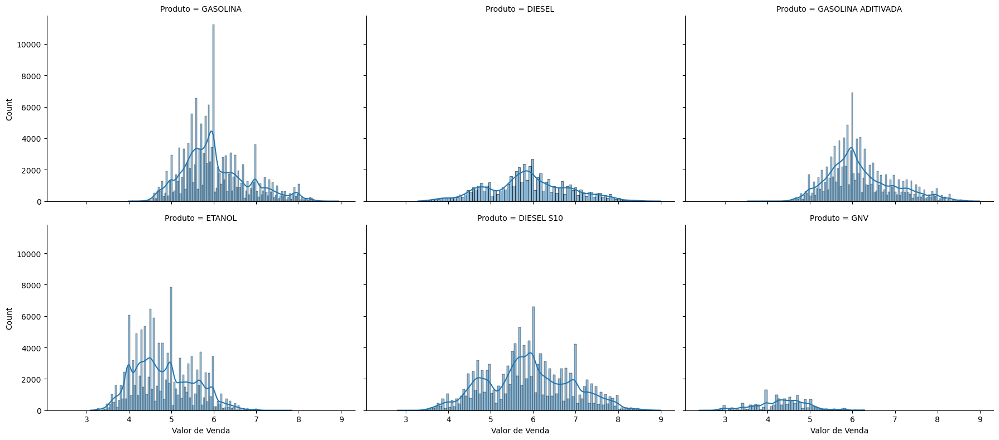

In [143]:
g = sns.FacetGrid(dados_nordeste, col="Produto", col_wrap=3, height=4, aspect=1.5)
g.map(sns.histplot, "Valor de Venda", kde=True)

## 2.2. Verificando Normalidade dos Dados

In [144]:
def qqplot(data, **kwargs):
    stats.probplot(data, dist="norm", plot=plt)

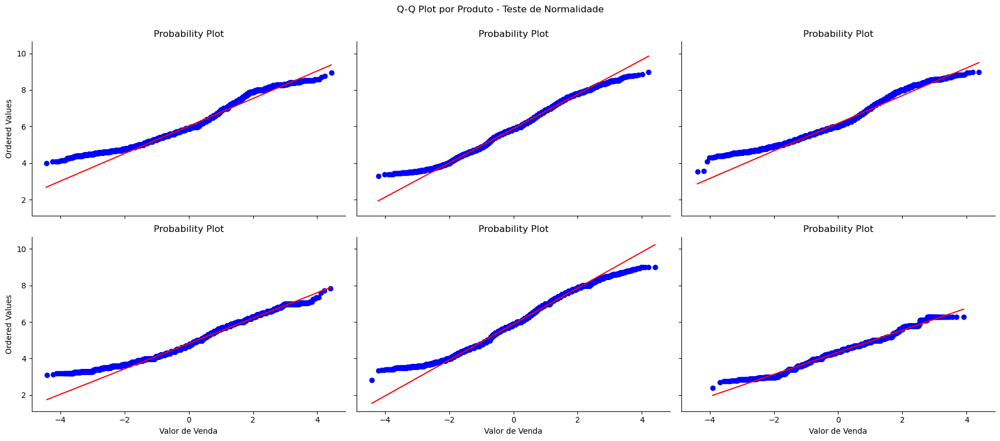

In [145]:
g = sns.FacetGrid(dados_nordeste, col="Produto", col_wrap=3, height=4, aspect=1.5)
g.map(qqplot, "Valor de Venda")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Q-Q Plot por Produto - Teste de Normalidade")
plt.show()

In [146]:
estatistica, p = statsmodels.stats.diagnostic.lilliefors(dados_nordeste["Valor de Venda"], dist = "norm")
print("Estatística do Teste: ", round(estatistica, 2))
print("P-valor: ", p)

Estatística do Teste:  0.05
P-valor:  0.0009999999999998899


## 3. Análise Temporal do dados

In [152]:
dados_nordeste['Ano_Trimestre'] = dados_nordeste['Data da Coleta'].dt.to_period('Q')

In [153]:
media_precos_trimestre = dados_nordeste.groupby(['Ano_Trimestre', 'Produto'])['Valor de Venda'].mean().reset_index()

In [154]:
# Converter 'Ano_Trimestre' para o primeiro dia do trimestre
dados_nordeste['Ano_Trimestre'] = dados_nordeste['Ano_Trimestre'].dt.start_time

In [158]:
# Converter a coluna 'Ano_Trimestre' para string
media_precos_trimestre_filtrado['Ano_Trimestre'] = media_precos_trimestre_filtrado['Ano_Trimestre'].astype(str)

In [159]:
# Criar o gráfico de linha com os produtos filtrados
fig = px.line(media_precos_trimestre_filtrado, 
              x='Ano_Trimestre', 
              y='Valor de Venda', 
              color='Produto', 
              markers=True, 
              title='Variação dos Preços de Combustíveis por Trimestre (2021-2024)', 
              labels={'Ano_Trimestre': 'Ano e Trimestre', 'Valor de Venda': 'Preço Médio de Venda'})

# Personalizar o layout
fig.update_layout(xaxis_title='Ano e Trimestre', 
                  yaxis_title='Preço Médio de Venda', 
                  xaxis_tickformat='%Y-Q%q',
                  xaxis_title_font_size=12, 
                  yaxis_title_font_size=12, 
                  title_font_size=16)

# Mostrar o gráfico
fig.show()